In [26]:
import tensorflow as tf
import numpy as np
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer, Input, Lambda, Conv2D, Dropout, Multiply, GlobalMaxPooling2D, MaxPooling2D, TimeDistributed, LSTM, Conv2DTranspose, concatenate, Concatenate, Dense, BatchNormalization, Activation, SeparableConv2D, add, Add, Multiply, SeparableConv2D, GlobalAveragePooling2D, DepthwiseConv2D, UpSampling2D, ZeroPadding2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import utils
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt


# set global random seed
seed_value = 42

os.environ['PYTHONHASHSEED'] = str(seed_value)
import random
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [2]:
# Check if TensorFlow is using the Metal plugin (I'm using a Macbook Air with a built in 16-core Neural Engin, want to make sure I'm using that to ensure faster runtime)
print("TensorFlow is using Metal:", tf.config.list_physical_devices('GPU'))

TensorFlow is using Metal: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Data Preprocessing

In [3]:
# ---- Global Variables and Methods----
IMAGE_FOLDER = "images/"
SAL_MAP_FOLDER = "saliency_maps/"
CSV_FILE = 'image_types.csv'
IMG_SIZE = (224, 224, 3)

In [4]:
# ---- Data Generator ----
class DataGenerator(tf.keras.utils.Sequence):
    '''
    A custom data loader for the UI images and saliency maps, inheriting from tf.keras.utils.Sequence.
    For instance, can be used with the following methods:
        model.fit(train_data_gen, validation_data=val_data_gen, ...)
        predictions = model.predict(data_gen)
        loss, mae = model.evaluate(data_gen)
    '''
    def __init__(self, image_folder, sal_map_folder, filenames, batch_size=1, shuffle=True, sample_size=None):
        '''
        Constructor:
            image_folder (str): Path to the folder containing input images.
            sal_map_folder (str): Path to the folder containing saliency maps.
            filenames (list): List of filenames to include in this generator.
            batch_size (int): Number of samples per batch.
            shuffle (bool): Whether to shuffle the data at the end of each epoch.
            sample_size (int): Number of samples to use (for debugging).
        '''
        self.image_folder = image_folder # string, path to the folder containing input images
        self.sal_map_folder = sal_map_folder # string, path to the folder containing saliency maps
        self.batch_size = batch_size # int, number of samples per batch
        self.filenames = filenames # list of filenames (shared between the input images and their corresponding saliency maps) to convert to data
        self.sample_size = sample_size
        self.shuffle = shuffle # boolean, if using random shuffle each epoch

        # Limit the dataset to a (smaller) sample_size if specified
        if self.sample_size and self.sample_size<len(self.filenames):
            self.filenames = self.filenames[:self.sample_size]

        self.on_epoch_end() # random shuffle

    def on_epoch_end(self): # if using random shuffle each epoch
        '''If shuffle=True, shuffles the list of filenames to randomize the order of data for the next epoch (automatically called by Keras)'''
        if self.shuffle:
            np.random.shuffle(self.filenames)

    def __len__(self):
        '''Returns the number of batches per epoch'''
        return int(np.floor(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        '''
        Generates one batch of data given the index of the batch (automatically called by Keras)
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        
        Can be called using the [] indexing operator
        '''
        # select a subset of filenames for the current batch
        batch_files = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        # load and preprocess the images and saliency maps for the specified batch
        return self.__data_generation(batch_files)
    
    def __data_generation(self, batch_files):
        '''
        Load and preprocess the images and saliency maps.
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        '''
        X, Y = [], []
        for file in batch_files:
            # UI image
            img_path = os.path.join(self.image_folder, file)
            img = load_img(img_path, target_size=IMG_SIZE[:2]) # load and resize image to IMG_SIZE
            img = img_to_array(img) / 255.0 # convert images to arrays and normalize them to [0,1]
            
            # corresponding saliency map (grayscale)
            sal_path = os.path.join(self.sal_map_folder, file)
            sal_img = load_img(sal_path, target_size=IMG_SIZE[:2], color_mode="grayscale") # load and resize image to IMG_SIZE
            sal_img = img_to_array(sal_img) / 255.0 # convert images to arrays and normalize them to [0,1], use normalize()????
            
            X.append(img)
            Y.append(sal_img)

        return np.array(X), np.array(Y) # convert from list to np.arrays

In [119]:
# ---- Handle Missing Data ----
# Load the CSV file into a DataFrame
df = pd.read_csv(CSV_FILE, sep=',')

# Get the list of filenames from the CSV file, the image folder, and the saliency map folder
csv_filenames = set(df["Image Name"])
image_filenames = set(os.listdir(IMAGE_FOLDER))
sal_map_filenames = set(os.listdir(SAL_MAP_FOLDER))

print(f"There are {len(csv_filenames)} filenames in the CSV file.")
print(f"There are {len(image_filenames)} filenames in the Image folder.")
print(f"There are {len(sal_map_filenames)} filenames in the Saliency Map folder.")


# Find filenames that are missing in any of the three locations
missing_files = (csv_filenames | image_filenames | sal_map_filenames) - (csv_filenames & image_filenames & sal_map_filenames)

# Print missing filenames
if missing_files:
    print("The following filenames are missing in one or more locations:")
    for filename in missing_files:
        print(filename)
else:
    print("All filenames are present in all three locations.")

# Remove missing filenames from the CSV file
df = df[~df['Image Name'].isin(missing_files)]

print(f"Removed {len(missing_files)} filenames from the CSV file.\n")
print(f'Remaining Number of Data Samples:{df.shape[0]}')
print(f'Remaining Number of Desktop Samples:{df[df["Category"] == "desktop"].shape[0]}')
print(f'Remaining Number of Mobile Samples:{df[df["Category"] == "mobile"].shape[0]}')
print(f'Remaining Number of Web Samples:{df[df["Category"] == "web"].shape[0]}')
print(f'Remaining Number of Poster Samples:{df[df["Category"] == "poster"].shape[0]}')

There are 1463 filenames in the CSV file.
There are 1483 filenames in the Image folder.
There are 1924 filenames in the Saliency Map folder.
The following filenames are missing in one or more locations:
d205d8.png
f9ae9f.jpg
cdbd16.png
d355a9.jpg
a47405.png
bf66e8.png
e5174e.jpg
4d0fc2.jpg
90032b.png
79672d.jpg
574bac.png
fb8701.png
e0f578.png
51f12a.jpg
4e81ec.png
fcac91.png
46e638.jpg
aa063a.png
075286.png
4e729d.png
e20a6e.png
eb34f4.png
520b4a.png
ed727a.png
c90ca1.png
6dc873.png
cc25e1.png
c01b8e.jpg
fdafcb.png
e348b5.jpg
a44943.png
5bf483.jpg
a64332.jpg
c71a6f.png
49e0ba.png
e93e5e.jpg
49046b.png
4d17b7.jpg
e3d203.jpg
80126c.png
cdcaf8.jpg
35aa58.png
e2f692.png
ed1239.png
a85808.png
cd9e29.jpg
c5ea52.jpg
045f81.png
d594d5.jpg
4afbad.png
6d8534.png
c84d32.jpg
bf4440.png
5baa74.png
e7022f.png
a11833.jpg
73386c.png
037d19.png
5c0bcf.png
ab7961.jpg
085001.jpg
fff715.jpg
4c739f.jpg
ebe076.jpg
33d2a6.png
e946d8.jpg
5b5a0c.png
fc70db.jpg
5cfc08.png
e78858.png
ff7d76.jpg
0529f2.png
49fc6

In [121]:
# ---- Initialize DataLoaders ----

# Filter by category if needed (desktop, poster, mobile, web) !!!
df = df[df['Category'] == "desktop"]

# Split the training data by randomly selecting valid_size*100% of the training data for validation
train_files = df[df['Train/Test'] == 'Train']['Image Name'].tolist()
valid_size = 0.2 # Split ratio
valid_indices = np.random.choice(len(train_files), int(len(train_files) * valid_size), replace=False)

# Get the list of...
valid_files = [train_files[i] for i in valid_indices] # validation filenames
train_files = [train_files[i] for i in range(len(train_files)) if i not in valid_indices] # training filenames
test_files = df[df['Train/Test'] == 'Test']['Image Name'].tolist() # testing filenames

# Check the number of batches in each generator
print("Number of training samples:", len(train_files))
print("Number of validation samples:", len(valid_files))
print("Number of test samples:", len(test_files))

# Initialize the training, validation, testing DataGenerators
train_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, train_files, batch_size = 16)
valid_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, valid_files, shuffle=False, batch_size = 16) # no need to shuffle validation data
test_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files, shuffle=False, batch_size = 16) # no need to shuffle test data

# Check the number of batches in each generator
print("Number of training batches:", len(train_data_gen))
print("Number of validation batches:", len(valid_data_gen))
print("Number of test batches:", len(test_data_gen))

# View the first batch of training data
batch1 = train_data_gen[0]
print("Training input batch shape:", batch1[0].shape)
print("Training saliency batch shape:", batch1[1].shape)

Number of training samples: 276
Number of validation samples: 69
Number of test samples: 18
Number of training batches: 17
Number of validation batches: 4
Number of test batches: 1
Training input batch shape: (16, 224, 224, 3)
Training saliency batch shape: (16, 224, 224, 1)


# Defining Methods for Evaluating the Model Training Process and Performance

In [7]:
# Plot the learning curve
def plot_learning_curve(history):
    # Extract loss and metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    
    # Plot the loss curve (use combined loss!!!)
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
        
    plt.tight_layout()
    plt.show()

In [8]:
# Function to visualize the original image, ground truth saliency map, and predicted saliency map
def visualize_results(model, data_gen, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency map
        Y_pred = model.predict(X, verbose=0)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[0])  # Only use the first sample in the batch
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[0].squeeze(), cmap='gray')  # Only use the first sample in the batch
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(Y_pred[0].squeeze(), cmap='gray')  # Only use the first sample in the batch
        plt.title("Predicted Saliency Map")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Defining the Loss Terms and Model Evaluation Metrics

### Define various normalization and scaling functions

In [110]:
# ----------------------------- Scaling Functions ----------------------------- 

def batch_min_max_scaling(heatmap):
    '''
    Min-Max scaling
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))
    
    return heatmap

def min_max_scaling(heatmap):
    '''
    Min-Max scaling
    '''
    # Compute min and max for each sample in the batch
    min_vals = K.min(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)
    max_vals = K.max(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)

    # Apply min-max scaling to each sample
    heatmap = (heatmap - min_vals) / (K.epsilon() + max_vals - min_vals)

    return heatmap

def max_scaling(heatmap):
    '''
    Max scaling
    This method is adapted from 'sal_imp_utilities.py' written by the UEyes team.
    '''

    max_heatmap = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(heatmap, axis=[1,2]), axis=2),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    heatmap /= max_heatmap
    
    return heatmap




# ----------------------------- Normalization Functions ----------------------------- 

def batch_sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across the tensor (batch).
    '''
    heatmap /= (K.epsilon() + K.sum(heatmap))

    return heatmap

def sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across each map in the tensor (batch).
    '''

    heatmap /= (K.epsilon() + K.sum(heatmap, axis=[1, 2], keepdims=True))

    return heatmap

def whitening(heatmap):
    '''
    Apply whitening algorithm, which is basically mean-std normalization but for each pixel???
    See https://en.wikipedia.org/wiki/Whitening_transformation
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'whiten'
    '''

    # Convert input to TensorFlow tensor if it's a NumPy array
    if isinstance(heatmap, np.ndarray):
        heatmap = tf.convert_to_tensor(heatmap)

    # Compute mean and std over the spatial dimensions (height and width)
    heatmap_mean = K.mean(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, channels)
    heatmap_std = K.std(heatmap, axis=[1, 2], keepdims=True)    # Shape: (batch_size, 1, 1, channels)

    # Normalize the heatmap
    return (heatmap - heatmap_mean) / (heatmap_std + K.epsilon())

def mean_std_normalize(heatmap):
    '''
    Zero mean and unit variance normalization across each map in the tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team
    '''

    # Convert input to TensorFlow tensor if it's a NumPy array
    if isinstance(heatmap, np.ndarray):
        heatmap = tf.convert_to_tensor(heatmap)

    # Flatten spatial dimensions (height * width)
    heatmap_flat = K.batch_flatten(heatmap)  # Shape: (batch_size, height * width)

    # Compute mean and std across all spatial positions
    heatmap_mean = K.mean(heatmap_flat, axis=-1, keepdims=True)  # Shape: (batch_size, 1)
    heatmap_std = K.std(heatmap_flat, axis=-1, keepdims=True)    # Shape: (batch_size, 1)

    # Reshape mean and std for broadcasting back to original shape
    heatmap_mean = K.reshape(heatmap_mean, (-1, 1, 1, 1))  # (batch_size, 1, 1, 1)
    heatmap_std = K.reshape(heatmap_std, (-1, 1, 1, 1))    # (batch_size, 1, 1, 1)

    # Normalize the heatmap
    return (heatmap - heatmap_mean) / (heatmap_std + K.epsilon())

### Define various loss functions

In [111]:
# ------------------------------------ Losses used by UEyes Team ------------------------------------

mse = tf.keras.losses.MeanSquaredError()


def nss_(y_true, y_pred):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    ax = 1

    if K.all(K.equal(K.sum(K.sum(y_true, axis=ax), axis=ax), 0.0)):
        return 0.0

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=ax), axis=ax), axis=ax+1), IMG_SIZE[0], axis=ax), axis=ax+1), IMG_SIZE[1], axis=ax+1)

    y_pred /= max_y_pred

    y_pred_flatten = K.batch_flatten(y_pred)

    y_mean = K.mean(y_pred_flatten, axis=-1)
    y_mean = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_mean)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_std = K.std(y_pred_flatten, axis=-1)
    y_std = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_std)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_pred = (y_pred - y_mean) / (y_std + K.epsilon())

    den = K.sum(K.sum(y_true * y_pred, axis=ax), axis=ax)
    nom = K.sum(K.sum(y_true, axis=ax), axis=ax) + K.epsilon()

    return den/nom


def nss(y_true, y_pred):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    if K.all(K.equal(K.sum(y_true, axis=[1,2]), 0.0)):
        return 0.0

    y_pred = max_scaling(y_pred) # why use max-scaling at all before normalization???
    y_pred = mean_std_normalize(y_pred)

    den = K.sum(y_true * y_pred, axis=[1,2])
    nom = K.sum(y_true, axis=[1,2]) + K.epsilon()

    return den/nom

def correlation_coefficient_(y_true, y_pred):
    """
    Compute Cross-Correlation (CC) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= max_y_pred

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(K.sum(y_true * y_pred, axis=1), axis=1)
    sum_x = K.sum(K.sum(y_true, axis=1), axis=1)
    sum_y = K.sum(K.sum(y_pred, axis=1), axis=1)
    sum_x_square = K.sum(K.sum(K.square(y_true), axis=1), axis=1)
    sum_y_square = K.sum(K.sum(K.square(y_pred), axis=1), axis=1)

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    return num / den

def correlation_coefficient(y_true, y_pred):
    """
    Compute Absolute Correlation Coefficient score, range is [0,1]
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    #y_pred = max_scaling(y_pred) # idk why use max-scaling at all before normalization, makes little difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(y_true * y_pred, axis=[1,2])
    sum_x = K.sum(y_true, axis=[1,2])
    sum_y = K.sum(y_pred, axis=[1,2])
    sum_x_square = K.sum(K.square(y_true), axis=[1,2])
    sum_y_square = K.sum(K.square(y_pred), axis=[1,2])

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    return K.abs(num / den) # take the absolute value to bound range bt [0,1] instead of [-1,1]???


def batch_min_max_sum_normalize(heatmap):
    '''
    Min-Max scaling
    Sum Normalize heatmap values in the [0,1] range across entire tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))

    # Sum normalization
    heatmap /= (K.epsilon() + K.sum(heatmap))
    
    return heatmap

def similarity_(y_true, y_pred):
    '''
    Compute Similarity score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    y_pred = batch_min_max_sum_normalize(y_pred)
    y_true = batch_min_max_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))


def similarity(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the normalized predicted map and ground-truth map. 
    The absence of saliency values points to zero similarity (sensitive to failed detection of saliency points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # original normalization implementation, not sure what the point of min-max scaling is before the sum normalization, makes little difference???
    #y_pred = batch_min_max_scaling(y_pred)
    #y_true = batch_min_max_scaling(y_true)

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))


kl = tf.keras.losses.KLDivergence() # Initialize the KL Divergence loss instance once
def kl_divergence(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss, range is [0,inf)
    Quantifies the difference between the distributions of the saliency map prediction and the ground truth (the smaller the better)

    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    #y_pred = max_scaling(y_pred) # used axis=1??? also idk why use max-scaling at all before normalization, makes no difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # min-max scaling s.t. pixels of maps in each batch is bt [0,1]
    #y_pred = batch_min_max_scaling(y_pred)
    #y_true = batch_min_max_scaling(y_true)
    
    return kl(y_true,y_pred)

def kl_divergence_(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= max_y_pred

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())
    
    return kl(y_true,y_pred)




# ------------------------------------ New Losses to Consider ------------------------------------

mae = tf.keras.losses.MeanAbsoluteError()
"""
Compute the MAE between two (batches of) saliency maps y and y'.
"""


cosine_similarity = tf.keras.metrics.CosineSimilarity(axis=[1,2])
"""
Compute the cosine similarity between two (batches of) saliency maps y and y'.
"""

def similarity_opposite(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the maximum value of the normalized predicted map and ground-truth map. 
    The absence of non-salient values points to zero similarity (sensitive to failed detection of non-salient points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # original normalization implementation, not sure what the point of min-max scaling is before the sum normalization, makes little difference???
    #y_pred = batch_min_max_scaling(y_pred)
    #y_true = batch_min_max_scaling(y_true)

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.maximum(y_pred, y_true))

def entropy(y_true, y_pred):
    """
    TODO: binary focal cross entropy from keras
    """
    return

### Combine different loss functions to form loss terms

In [113]:
# ------------------------------------ Loss Combinations used by UEyes Team ------------------------------------

def combined_loss_UEyes(y_true, y_pred):
    '''
    Uses functions implemented by us.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s = similarity(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    #return kl_weight*k - nss_weight*n + mse_weight*m #- cc_weight*c - sim_weight*s
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 

def combined_loss_UEyes_(y_true, y_pred):
    '''
    Uses functions implemented by UEyes team.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence_(y_true, y_pred)
    c = correlation_coefficient_(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss_(y_true, y_pred)
    s = similarity_(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 


def combined_loss_UEyes_2(y_true, y_pred):
    '''
    Uses functions implemented by us.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    n = nss(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n + mse_weight*m 

def combined_loss_UEyes_2_(y_true, y_pred):
    '''
    Uses functions implemented by UEyes team.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence_(y_true, y_pred)
    n = nss_(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n + mse_weight*m 

# ------------------------------------ New Loss Combinations to Consider ------------------------------------
def combined_loss(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    TODO: add the new loss terms to consider
    '''

    # loss term weights
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    #mse_weight=1
    #mae_weight=1
    cs_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s = similarity(y_true, y_pred)
    #m = mse(y_true, y_pred)
    #m = mae(y_true, y_pred)
    cs = cosine_similarity(y_true, y_pred)
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c - cs_weight*cs #+ mae_weight*m

def combined_loss_2(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    TODO: add the new loss terms to consider
    '''

    # loss term weights
    kl_weight=8.0
    cc_weight=2.0
    sim_weight=3.0
    sim_oppo_weight=5.0
    nss_weight=8.0
    mse_weight=1
    #mae_weight=1
    cs_weight=1.0

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s1 = similarity(y_true, y_pred)
    s2 = similarity_opposite(y_true, y_pred)
    m = mse(y_true, y_pred)
    #m = mae(y_true, y_pred)
    cs = cosine_similarity(y_true, y_pred)
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s1 - sim_oppo_weight*s2 - cs_weight*cs + mse_weight*m # - cc_weight*c 

### Define various evaluation metrics

In [12]:
# ------------------------------------ Metrics used by UEyes Team ------------------------------------

auc_ROC = tf.keras.metrics.AUC(num_thresholds=100) # Initialize the AUC metric instance once
def auc_judd(y_true, y_pred):
    """
    Compute AUC-Judd score (from the ROC curve).
    """

    auc_ROC.update_state(y_true, y_pred)
    return auc_ROC.result()


def information_gain(y_true, y_pred, baseline="uniform"):
    """
    Compute Information Gain (IG) score. 
    (TODO: check the definition bc UEyes didn't provide implementation)!!!

    Positive IG: Indicates that the predicted saliency map provides more information than the baseline.
    Zero IG: Indicates that the predicted saliency map provides the same amount of information as the baseline.
    Negative IG: Indicates that the predicted saliency map provides less information than the baseline.
    """

    # Define the baseline ???
    y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    if baseline == "uniform":
        # Uniform distribution (1/N)
        y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    elif baseline == "center":
        # Create a center bias map (Gaussian centered at the image center)
        x = tf.linspace(-1.0, 1.0, 224)
        y = tf.linspace(-1.0, 1.0, 224)
        x, y = tf.meshgrid(x, y)
        y_baseline = tf.exp(-(x**2 + y**2) / 0.1)  # Gaussian kernel
        y_baseline = y_baseline / (K.sum(y_baseline) + K.epsilon())  # Normalize
        y_baseline = tf.expand_dims(y_baseline, axis=-1)  # Add channel dimension
        y_baseline = tf.expand_dims(y_baseline, axis=0)  # Add batch dimension

    
    # Sum normalization (so that the saliency maps are normalized to sum to 1, i.e., are probability distributions) ???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # Compute log-likelihood ratio
    log_ratio = K.log((y_pred + K.epsilon()) / (y_baseline + K.epsilon()))

    # Compute IG
    return K.mean(K.sum(y_true * log_ratio, axis=[1, 2]))


# ------------------------------------ New Metrics to Consider ------------------------------------

auc_PR_ = tf.keras.metrics.AUC(num_thresholds=100, curve='PR') # Initialize the AUC metric instance once
def auc_PR(y_true, y_pred):
    """
    Compute AUC score (from the precision-recall curve).
    """

    auc_PR_.update_state(y_true, y_pred)
    return auc_PR_.result()


In [109]:
# TODO: verify that all the above functions work with batch saliency map tensors
#print(train_data_gen[4][1].shape)
#print(tf.math.count_nonzero(tf.not_equal(kl_divergence(train_data_gen[4][1], train_data_gen[0][1]), kl_divergence_(train_data_gen[4][1], train_data_gen[0][1]))).numpy())
#print(tf.math.count_nonzero(tf.not_equal(nss(train_data_gen[4][1], train_data_gen[0][1]), nss_(train_data_gen[4][1], train_data_gen[0][1]))).numpy())
#print(tf.math.count_nonzero(tf.not_equal(similarity(train_data_gen[4][1], train_data_gen[0][1]), similarity_(train_data_gen[4][1], train_data_gen[0][1]))).numpy())
#print(tf.math.count_nonzero(tf.not_equal(correlation_coefficient(train_data_gen[4][1], train_data_gen[0][1]), correlation_coefficient_(train_data_gen[4][1], train_data_gen[0][1]))).numpy())
#print(K.mean(correlation_coefficient(train_data_gen[4][1], train_data_gen[0][1])-correlation_coefficient_(train_data_gen[4][1], train_data_gen[0][1])))

#print("kl_divergence: ", kl_divergence(train_data_gen[4][1], train_data_gen[0][1]))
#print("kl_divergence: ", kl_divergence_(train_data_gen[4][1], train_data_gen[0][1]))
#print("correlation_coefficient: ", correlation_coefficient(train_data_gen[4][1], train_data_gen[0][1]))
#print("correlation_coefficient: ", correlation_coefficient_(train_data_gen[4][1], train_data_gen[0][1]))
#print("similarity: ", similarity(train_data_gen[4][1], train_data_gen[0][1]))
#print("similarity: ", similarity_(train_data_gen[4][1], train_data_gen[0][1]))
#print("nss: ", nss(train_data_gen[4][1], train_data_gen[0][1]))
#print("nss: ", nss_(train_data_gen[4][1], train_data_gen[0][1]))
#print("mse: ", mse(train_data_gen[4][1], train_data_gen[0][1]))
#print("mae: ", mae(train_data_gen[4][1], train_data_gen[0][1]))
#print("auc_judd: ", auc_judd(train_data_gen[4][1], train_data_gen[0][1]))
#print("information_gain: ", information_gain(train_data_gen[4][1], train_data_gen[0][1]))
#print("cosine_similarity: ", cosine_similarity(train_data_gen[4][1], train_data_gen[0][1]))
#print("auc_PR: ", auc_PR(train_data_gen[4][1], train_data_gen[0][1]))
#print(entropy(train_data_gen[4][1], train_data_gen[0][1]))

16
tf.Tensor(1.19325705e-08, shape=(), dtype=float32)
correlation_coefficient:  tf.Tensor(
[[-0.04612454]
 [ 0.26609942]
 [ 0.0268663 ]
 [ 0.10526535]
 [ 0.11328834]
 [ 0.20742673]
 [-0.08631344]
 [ 0.22331737]
 [ 0.13631   ]
 [ 0.37451383]
 [-0.03374876]
 [-0.01262554]
 [-0.11958021]
 [-0.02300279]
 [ 0.2268682 ]
 [ 0.31890997]], shape=(16, 1), dtype=float32)
correlation_coefficient:  tf.Tensor(
[[-0.04612453]
 [ 0.26609945]
 [ 0.02686632]
 [ 0.10526538]
 [ 0.11328831]
 [ 0.20742671]
 [-0.08631348]
 [ 0.22331741]
 [ 0.13630992]
 [ 0.37451372]
 [-0.03374886]
 [-0.01262542]
 [-0.11958018]
 [-0.0230028 ]
 [ 0.22686815]
 [ 0.3189099 ]], shape=(16, 1), dtype=float32)


In [14]:
combined_metrics=[#'mse', # Mean Squared Error
                  #'mae', # Mean Squared Error
                    auc_judd,  # AUC-Judd (of ROC curve)
                    #auc_PR,  # AUC of PR curve
                    nss,       # Normalized Scanpath Saliency
                    information_gain,  # Information Gain
                    similarity,  # Similarity
                    correlation_coefficient,  # Absolute Correlation Coefficient
                    #cosine_similarity, # Cosine Similarity
                    kl_divergence]  # KL Divergence

pd.set_option('display.float_format', '{:.15f}'.format)
def train_test_performance(model):
    '''
    Display the model's performance on training data and test data across different metrics.
    '''
    # Compute performance on train data
    performance_train = {}
    for metric in model.metrics:
        result = metric.result()
        result = result.numpy().item()
        if isinstance(result, dict):
            performance_train.update(result)
        else:
            performance_train[metric.name] = result
    performance_train = pd.DataFrame(performance_train,index=['Train'])

    # Compute performance on test data
    performance_test = model.evaluate(test_data_gen,return_dict=True, verbose=0)
    performance_test = pd.DataFrame(performance_test,index=['Test'])

    # Provide results in a table    
    return pd.concat([performance_train, performance_test])

# The Simplified Copycat UMSI++ Model

### Define the model architecture

In [15]:
# Define the UMSI++ model
def UMSI_simple(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_simple')  # Use a valid model name
    
    return model

### Define callbacks for training

In [30]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True) # Restore model weights from the epoch with the best value of val_loss. TODO: incorporate into trianing

### Train a model 'UMSI_ueyes' for 10 epochs (no batch training) using the combined loss term with MSE provided by UEyes

Model: "UMSI_simple"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 32  896         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 32  9248        ['block1_conv1[0][0]']           
                                )                                                       

2025-03-10 20:14:57.724681: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -0.0726 - auc_judd: 0.5441 - nss: 0.5907 - information_gain: 0.0301 - similarity: 0.3970 - correlation_coefficient: 0.2964 - kl_divergence: -0.0404

2025-03-10 20:15:33.727176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 44s 2s/step - loss: -0.0726 - auc_judd: 0.5441 - nss: 0.5907 - information_gain: 0.0301 - similarity: 0.3970 - correlation_coefficient: 0.2964 - kl_divergence: -0.0404 - val_loss: -0.2652 - val_auc_judd: 0.5435 - val_nss: 0.9972 - val_information_gain: 0.0556 - val_similarity: 0.4023 - val_correlation_coefficient: 0.4961 - val_kl_divergence: -0.0437
Epoch 2/12
17/17 [==============================] - 33s 2s/step - loss: -0.3125 - auc_judd: 0.5431 - nss: 1.0358 - information_gain: 0.0374 - similarity: 0.3990 - correlation_coefficient: 0.4983 - kl_divergence: -0.0431 - val_loss: -0.3486 - val_auc_judd: 0.5431 - val_nss: 1.0700 - val_information_gain: 0.0243 - val_similarity: 0.3936 - val_correlation_coefficient: 0.4953 - val_kl_divergence: -0.0400
Epoch 3/12
17/17 [==============================] - 31s 2s/step - loss: -0.3622 - auc_judd: 0.5432 - nss: 1.0955 - information_gain: 0.0372 - similarity: 0.3985 - correlation_coefficient: 0.5201 - kl_div

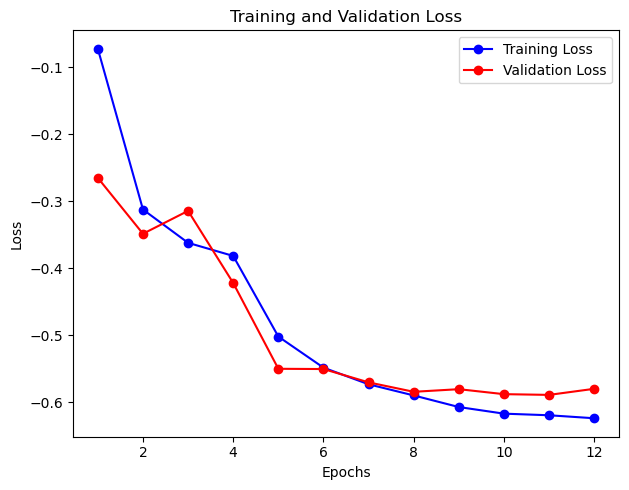

In [ ]:
opt = Adam(learning_rate=0.001)
UMSI_ueyes = UMSI_simple(input_shape=(224, 224, 3))
UMSI_ueyes.summary()

UMSI_ueyes.compile(optimizer=opt, loss = combined_loss_UEyes_2, metrics=combined_metrics)
history = UMSI_ueyes.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen)) #Train the model and capture the history
plot_learning_curve(history)

Epoch 1/12


2025-03-10 18:27:56.805091: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -0.1535 - auc_judd: 0.5622 - nss: 0.7449 - information_gain: 0.0330 - similarity: 0.3978 - correlation_coefficient: 0.3654 - kl_divergence: -0.0403

2025-03-10 18:28:28.305497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 39s 2s/step - loss: -0.1535 - auc_judd: 0.5622 - nss: 0.7449 - information_gain: 0.0330 - similarity: 0.3978 - correlation_coefficient: 0.3654 - kl_divergence: -0.0403 - val_loss: -0.3095 - val_auc_judd: 0.5599 - val_nss: 1.0561 - val_information_gain: 0.0510 - val_similarity: 0.4010 - val_correlation_coefficient: 0.5207 - val_kl_divergence: -0.0423
Epoch 2/12
17/17 [==============================] - 37s 2s/step - loss: -0.3305 - auc_judd: 0.5588 - nss: 1.0620 - information_gain: 0.0347 - similarity: 0.3972 - correlation_coefficient: 0.4964 - kl_divergence: -0.0409 - val_loss: -0.3552 - val_auc_judd: 0.5583 - val_nss: 1.1002 - val_information_gain: 0.0428 - val_similarity: 0.3983 - val_correlation_coefficient: 0.5361 - val_kl_divergence: -0.0369
Epoch 3/12
17/17 [==============================] - 45s 3s/step - loss: -0.3728 - auc_judd: 0.5581 - nss: 1.1100 - information_gain: 0.0264 - similarity: 0.3965 - correlation_coefficient: 0.5096 - kl_div

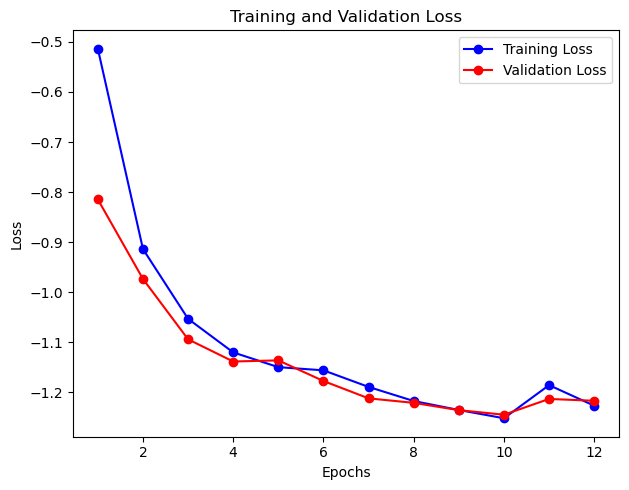

In [ ]:
# using loss implementations from UEyes team
opt = Adam(learning_rate=0.001)
UMSI_ueyes_ = UMSI_simple(input_shape=(224, 224, 3))
UMSI_ueyes_.compile(optimizer=opt, loss = combined_loss_UEyes_2_, metrics=combined_metrics)
history_ = UMSI_ueyes_.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen)) #TODO: why does Sim, NSS, CC approach 0 or nan?? # Train the model and capture the history
plot_learning_curve(history)

### Evaluate 'UMSI_ueyes's Performance on Training Data VS Test Data

##### Compare Performance Across Various Metrics

In [115]:
train_test_performance(UMSI_ueyes)

,loss,auc_judd,nss,information_gain,similarity,correlation_coefficient,kl_divergence
Train,-0.580075323581696,0.564793050289154,1.190682053565979,0.524288892745972,0.554914534091949,0.623844265937805,0.023030225187540
Test,-0.552918672561646,0.565120995044708,1.135579586029053,0.433199465274811,0.538864910602570,0.599683761596680,0.003321869997308


In [23]:
train_test_performance(UMSI_ueyes_)

,loss,auc_judd,nss,information_gain,similarity,correlation_coefficient,kl_divergence
Train,-0.585253477096558,0.566601276397705,1.198760032653809,0.466085106134415,0.566607475280762,0.627575039863586,0.023872394114733
Test,-0.559730708599091,0.566985726356506,1.148471951484680,0.373392045497894,0.540044963359833,0.606558084487915,0.005633697379380


##### Compare Model's Predicted Maps with Ground Truth Maps with Training and Test Data

2025-03-10 20:23:39.639003: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


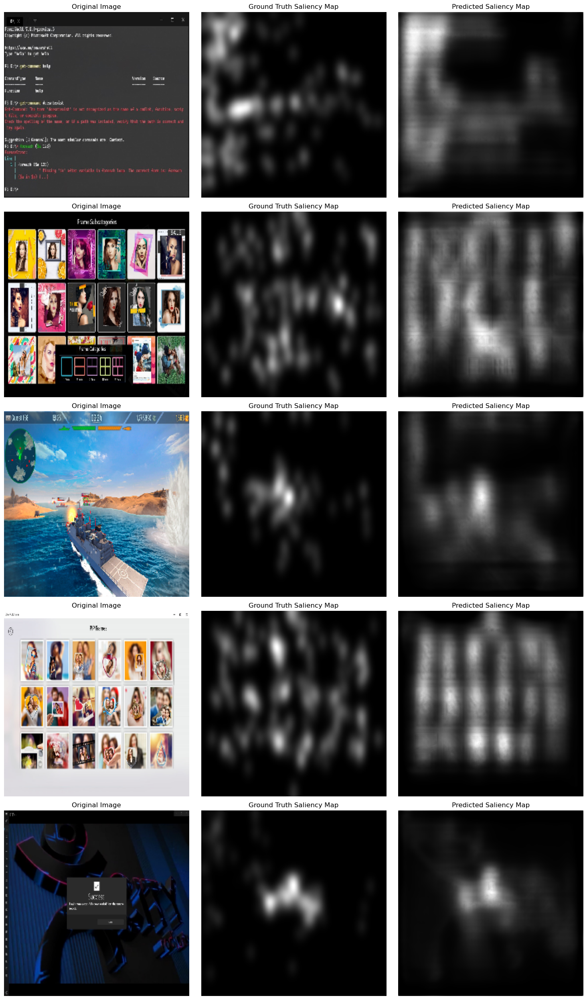

In [116]:
visualize_results(UMSI_ueyes, train_data_gen, num_samples=5) # 5 random traning examples

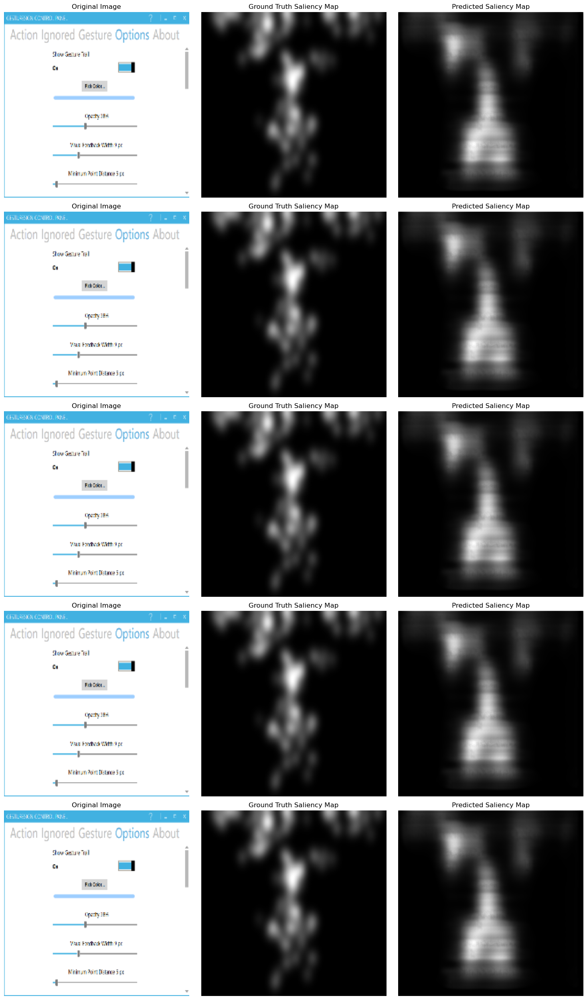

In [117]:
visualize_results(UMSI_ueyes, test_data_gen, num_samples=5) # 5 random test examples

2025-03-10 18:35:38.495737: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


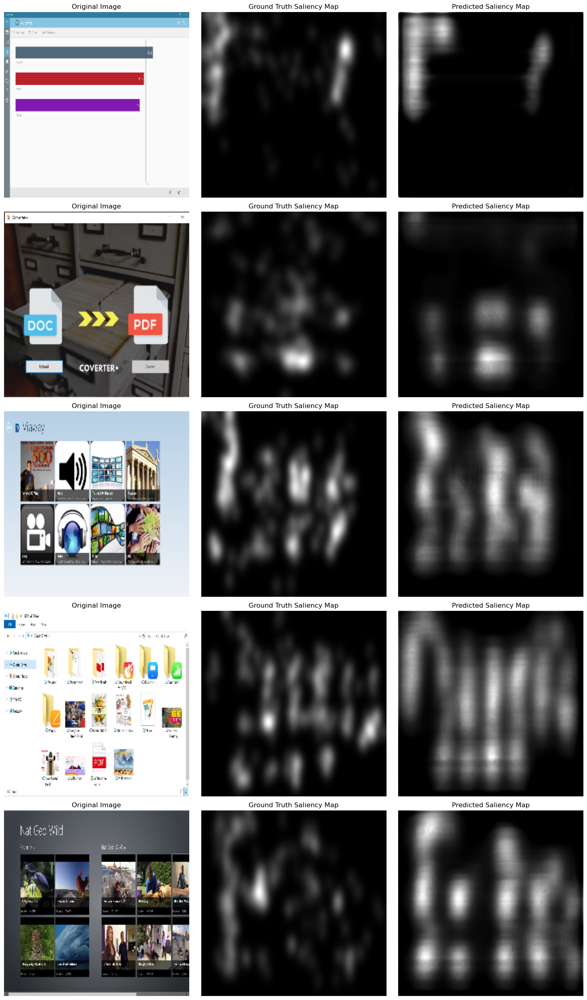

In [24]:
visualize_results(UMSI_ueyes_, train_data_gen, num_samples=5) # 5 random traning examples

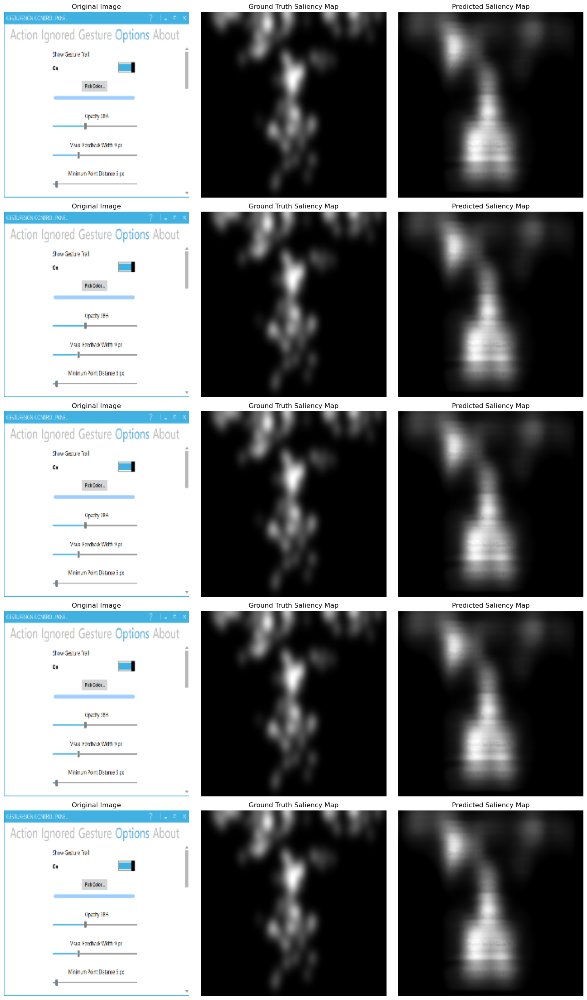

In [25]:
visualize_results(UMSI_ueyes_, test_data_gen, num_samples=5) # 5 random traning examples

### Train 2 models 'UMSI_mse' and 'UMSI_mae' for 10 epochs (no batch training) using only MSE or MAE loss, respectively
They are trained with 50 samples and validated on 10 samples instead of the full dataset, just to get a sense of how the two models compare.

In [27]:
# Build the models
UMSI_mse = UMSI_simple(input_shape=(224, 224, 3))
UMSI_mae = UMSI_simple(input_shape=(224, 224, 3))

Epoch 1/12


2025-03-10 18:50:57.692256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: 0.0518 - auc_judd: 0.5657 - nss: -0.0167 - information_gain: -4.2655 - similarity: 0.0741 - correlation_coefficient: 0.0260 - kl_divergence: 0.4309

2025-03-10 18:51:50.907420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 68s 4s/step - loss: 0.0518 - auc_judd: 0.5657 - nss: -0.0167 - information_gain: -4.2655 - similarity: 0.0741 - correlation_coefficient: 0.0260 - kl_divergence: 0.4309 - val_loss: 0.0258 - val_auc_judd: 0.5645 - val_nss: 0.0000e+00 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_correlation_coefficient: 0.0000e+00 - val_kl_divergence: 0.5381
Epoch 2/12
17/17 [==============================] - 70s 4s/step - loss: 0.0259 - auc_judd: 0.5634 - nss: 0.0000e+00 - information_gain: -5.2998 - similarity: 0.0000e+00 - correlation_coefficient: 0.0000e+00 - kl_divergence: 0.5206 - val_loss: 0.0258 - val_auc_judd: 0.5620 - val_nss: 0.0000e+00 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_correlation_coefficient: 0.0000e+00 - val_kl_divergence: 0.5381
Epoch 3/12
17/17 [==============================] - 74s 4s/step - loss: 0.0259 - auc_judd: 0.5608 - nss: 0.0000e+00 - information_gain: -5.2998 - similarity: 0.0000e+00 -

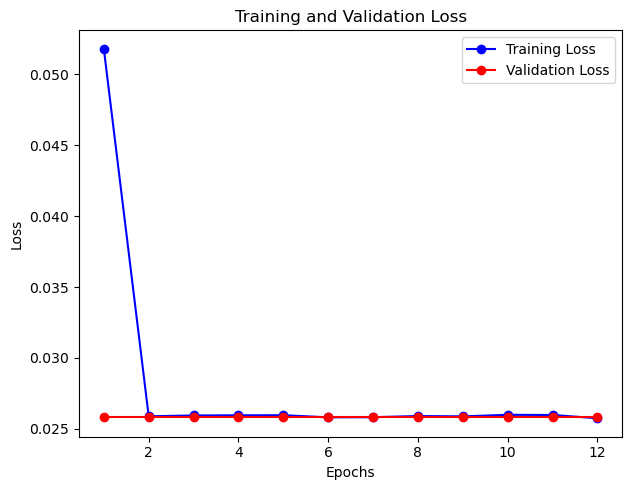

In [28]:
# Train the model using MSE loss
UMSI_mse.compile(optimizer=opt, loss = 'mse', metrics=combined_metrics)
history = UMSI_mse.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 19:06:00.456446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


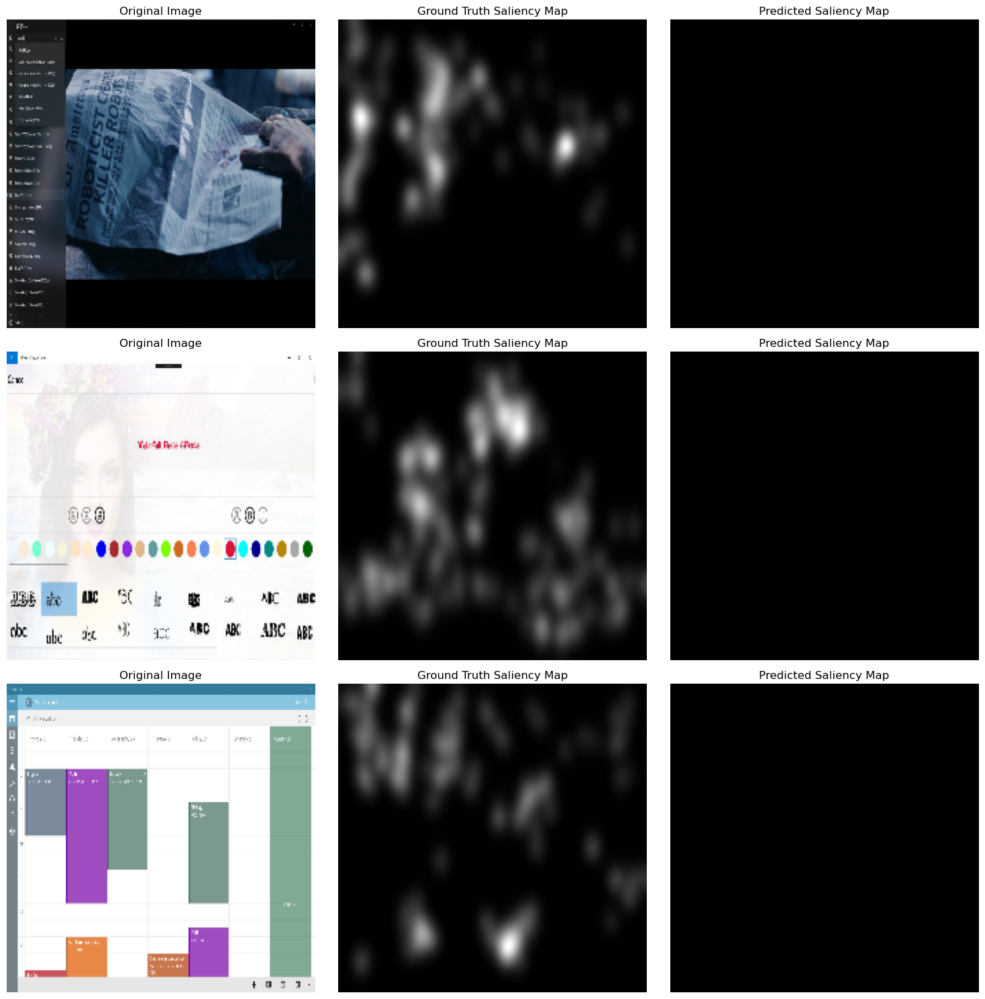

In [29]:
visualize_results(UMSI_mse, train_data_gen, num_samples=3) # 3 random examples

Epoch 1/10


2025-03-10 19:08:53.081974: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: 0.1175 - auc_PR: 0.5678 - nss_: nan

2025-03-10 19:09:45.822071: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 66s 4s/step - loss: 0.1175 - auc_PR: 0.5678 - nss_: nan - val_loss: 0.0772 - val_auc_PR: 0.5718 - val_nss_: nan
Epoch 2/10
17/17 [==============================] - 69s 4s/step - loss: 0.0773 - auc_PR: 0.5735 - nss_: nan - val_loss: 0.0772 - val_auc_PR: 0.5741 - val_nss_: nan
Epoch 3/10
17/17 [==============================] - 64s 4s/step - loss: 0.0772 - auc_PR: 0.5741 - nss_: nan - val_loss: 0.0772 - val_auc_PR: 0.5747 - val_nss_: nan
Epoch 4/10
17/17 [==============================] - 65s 4s/step - loss: 0.0770 - auc_PR: 0.5752 - nss_: nan - val_loss: 0.0772 - val_auc_PR: 0.5749 - val_nss_: nan


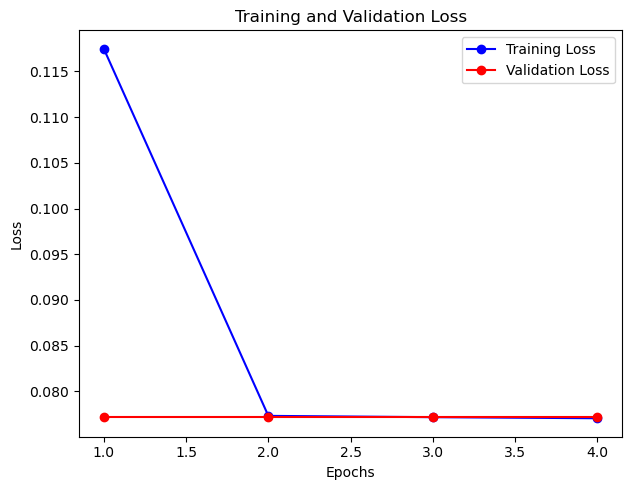

In [32]:
# Train the model using MAE loss (expected to have similar problem as the one with MSE)
UMSI_mae.compile(optimizer=opt, loss = 'mae', metrics=[auc_PR, nss_])
history = UMSI_mae.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen), callbacks=[early_stopping]) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 19:13:23.337155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


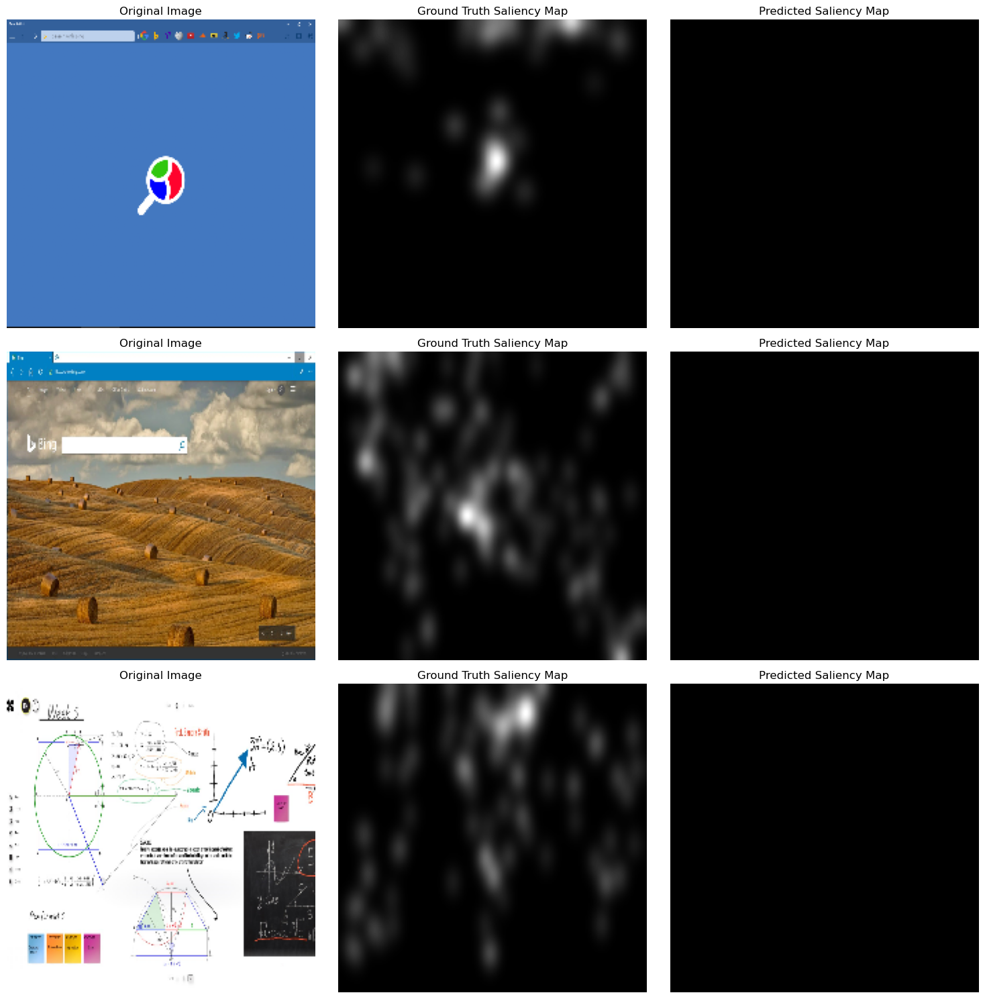

In [33]:
visualize_results(UMSI_mae, train_data_gen, num_samples=3) # 3 random examples

In [34]:
# Compare the two models' performances across different metrics
#print('Performance of model trained with MSE loss:')
#display(train_test_performance(UMSI_mse))
#print('Performance of model trained with MAE loss:')
#display(train_test_performance(UMSI_mae))

In [ ]:
# pick the MSE or MAE model, then train for 40 more epochs with the combined loss
#opt = Adam(learning_rate=0.0001)
#UMSI_simple.compile(optimizer=opt, loss = combined_loss, metrics=combined_metrics)

#history = UMSI_simple.fit(train_data_gen, validation_data=valid_data_gen, epochs=40, batch_size = 16) #, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
#plot_learning_curve(history)

##### Train the model using the (MSE, KLD, CC, SIM, NSS) combined loss with weights specified by the UEyes team 

Epoch 1/12


2025-03-10 20:29:08.731794: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -1.4725 - auc_judd: 0.5643 - nss: 0.6783 - information_gain: 0.0484 - similarity: 0.4026 - correlation_coefficient: 0.3474 - kl_divergence: -0.0486

2025-03-10 20:29:49.555562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 52s 2s/step - loss: -1.4725 - auc_judd: 0.5643 - nss: 0.6783 - information_gain: 0.0484 - similarity: 0.4026 - correlation_coefficient: 0.3474 - kl_divergence: -0.0486 - val_loss: -2.3044 - val_auc_judd: 0.5637 - val_nss: 1.0055 - val_information_gain: 0.1054 - val_similarity: 0.4158 - val_correlation_coefficient: 0.5109 - val_kl_divergence: -0.0416
Epoch 2/12
17/17 [==============================] - 30s 2s/step - loss: -2.3503 - auc_judd: 0.5636 - nss: 1.0219 - information_gain: 0.1067 - similarity: 0.4189 - correlation_coefficient: 0.5200 - kl_divergence: -0.0439 - val_loss: -2.5133 - val_auc_judd: 0.5634 - val_nss: 1.0808 - val_information_gain: 0.1107 - val_similarity: 0.4164 - val_correlation_coefficient: 0.5501 - val_kl_divergence: -0.0390
Epoch 3/12
17/17 [==============================] - 31s 2s/step - loss: -2.5918 - auc_judd: 0.5636 - nss: 1.1051 - information_gain: 0.1161 - similarity: 0.4209 - correlation_coefficient: 0.5604 - kl_div

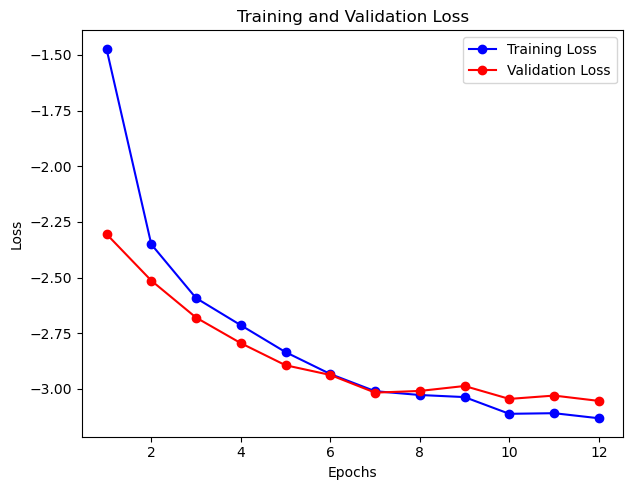

In [ ]:
# Train with loss implementations by the UEyes team 
UMSI_ueyes_all_ = UMSI_simple(input_shape=(224, 224, 3))
UMSI_ueyes_all_.compile(optimizer=opt, loss = combined_loss_UEyes_, metrics=combined_metrics)
history_all_ = UMSI_ueyes_all_.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[early_stopping]) # Train the model and capture the history
plot_learning_curve(history_all_)

2025-03-10 21:43:11.805714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


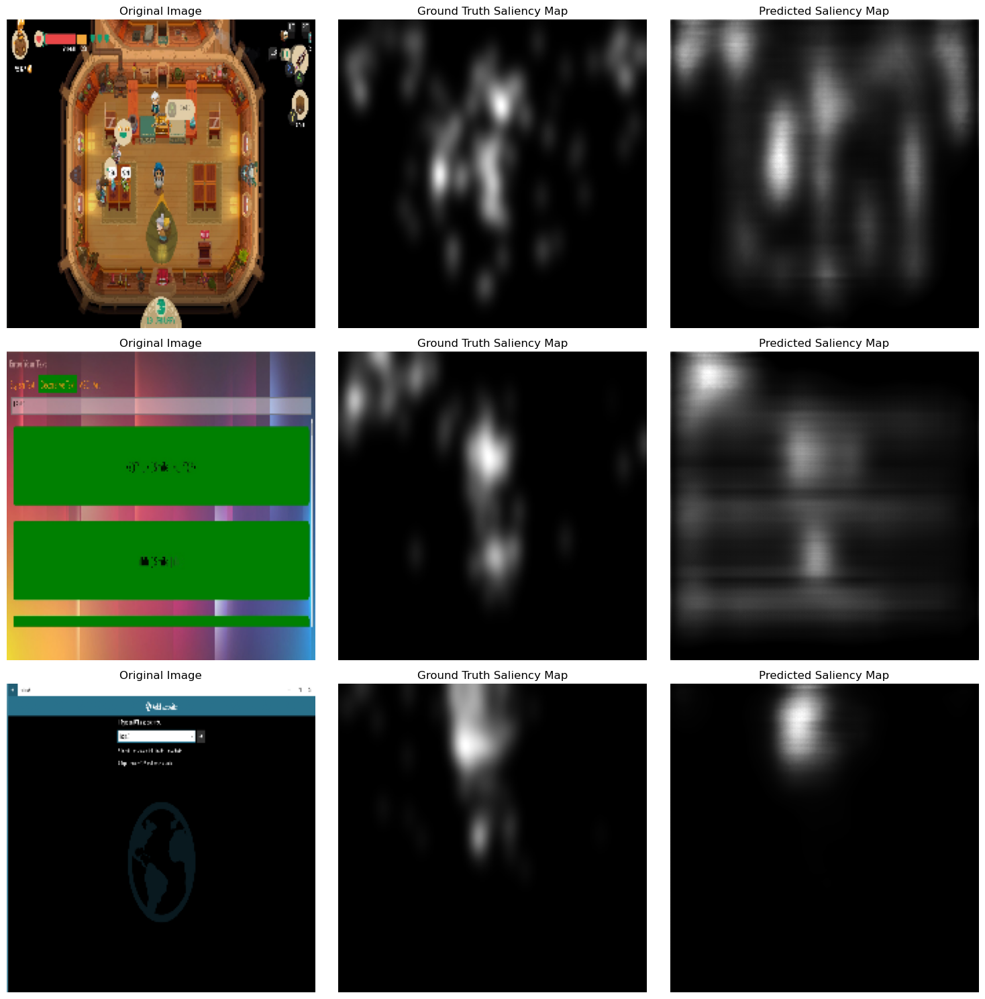

In [ ]:
visualize_results(UMSI_ueyes_all_, train_data_gen, num_samples=3) # 3 random examples

Epoch 1/12


2025-03-10 21:44:27.339300: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -0.7086 - auc_judd: 0.5793 - nss: -0.0619 - information_gain: -0.2500 - similarity: 0.3474 - correlation_coefficient: 0.1574 - kl_divergence: -0.0099

2025-03-10 21:45:02.099799: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 46s 2s/step - loss: -0.7086 - auc_judd: 0.5793 - nss: -0.0619 - information_gain: -0.2500 - similarity: 0.3474 - correlation_coefficient: 0.1574 - kl_divergence: -0.0099 - val_loss: -0.8852 - val_auc_judd: 0.5786 - val_nss: 0.0377 - val_information_gain: -0.0138 - val_similarity: 0.3999 - val_correlation_coefficient: 0.1827 - val_kl_divergence: -0.0381
Epoch 2/12
17/17 [==============================] - 24s 1s/step - loss: -1.2618 - auc_judd: 0.5780 - nss: 0.4149 - information_gain: 0.0459 - similarity: 0.3942 - correlation_coefficient: 0.2729 - kl_divergence: -0.0502 - val_loss: -2.0884 - val_auc_judd: 0.5777 - val_nss: 0.8728 - val_information_gain: 0.1370 - val_similarity: 0.4488 - val_correlation_coefficient: 0.4686 - val_kl_divergence: -0.0506
Epoch 3/12
17/17 [==============================] - 30s 2s/step - loss: -1.7374 - auc_judd: 0.5777 - nss: 0.7107 - information_gain: 0.0779 - similarity: 0.4224 - correlation_coefficient: 0.3668 - kl_

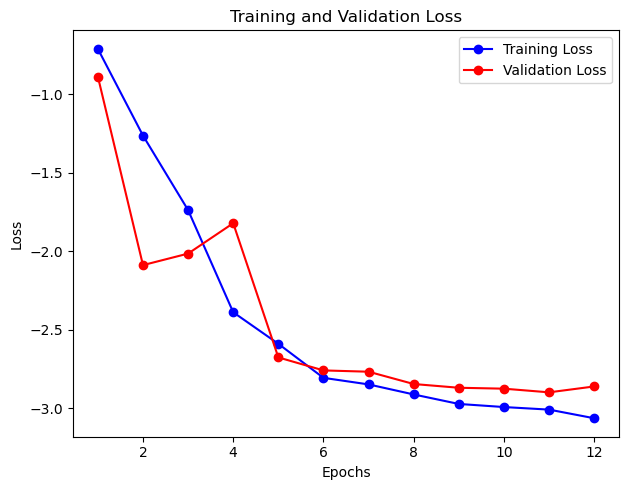

2025-03-10 21:50:26.672351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


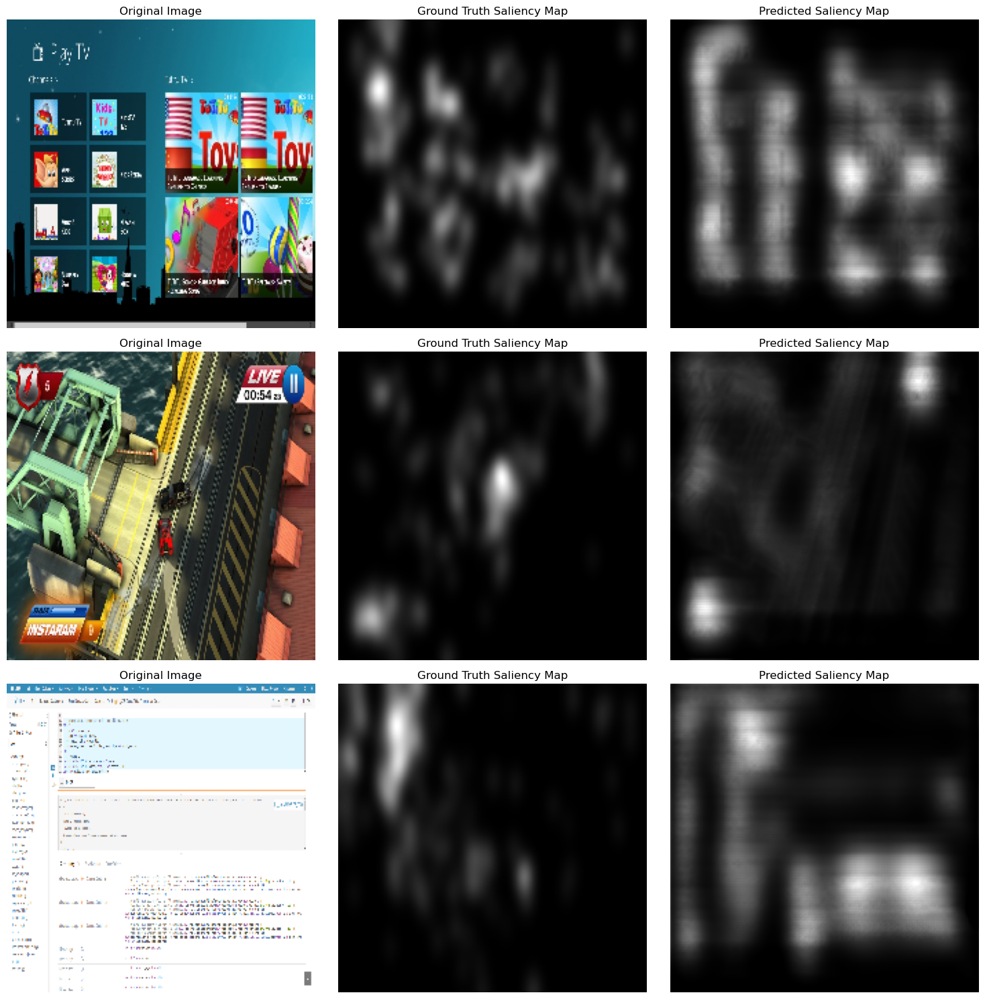

In [123]:
# Train with loss implementations by us.
UMSI_ueyes_all = UMSI_simple(input_shape=(224, 224, 3))
UMSI_ueyes_all.compile(optimizer=opt, loss = combined_loss_UEyes, metrics=combined_metrics)
history_all = UMSI_ueyes_all.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[early_stopping]) # Train the model and capture the history
plot_learning_curve(history_all)
visualize_results(UMSI_ueyes_all, train_data_gen, num_samples=3) # 3 random examples